# Ancient Texts: Predict if Hymn or Narrative

### Goal
To build a machine learning model that can classify whether a text is a hymn(or praise text)

### Purpose
To discover if there are quantifiable differences between hymns (or praise texts) and other textual genres

### Models in this notebook
**Random Forest**\
These models leverage randomness by combining the results of many models to help make more reliable final classifications
* These classifications have less bias, and lower variance than other standalone models
* They are also very scalable (thus can handle outliers easily, which is also a factor in this data set) and less susceptible to overfitting

**Gradient Boosting (XGBoost)**\
These models have a high accuracy rate, work well with missing data, are scalable, and can provide a weighted feature importance chart<br>
They also:
* Work well with structured/tabular data
* Have built-in regularization (L1 and L2) to prevent overfitting
* Build models sequentially, where each new model attempts to correct the errors made by the previous ones

Both Random Forest and gradient boosting models are appropriate for this project because of the large word count skew for some non-hymn texts and a few hymn texts <br>

They are also an excellent fit because a feature importances list can be extracted from the best performing tree in the case of the Random Forest and a weighted importances list (the number of times a feature is used to split the data) in the case of the XGBoost model <br> 

These lists reveal which features (e.g., specific ngrams) are most indicative of a hymn 
* This can inform further feature engineering or model refinement
* This can also reveal what bigrams, sentiment, et al, are most (or not) indicative of a hymn (or praise text)

### Steps
**Feature Development**:
* Created hstack feature that includes:
  * `top_word_freq` a feature that encodes the frequency of the top term (`tfidf_top_word`) identified by TF-IDF within the text (ancient_NLP_weights notebook) 
  * `divine_power_count` a feature that counts the occurrences of the TF-IDF identified top bigram ('divine power') across all entries in the column `lemmatized_summaries`
  * `divine_power_percent` a feature that calculates the percentage of occurrences of 'divine power' across all entries in the column `lemmatized_summaries`

**Collinearity Assessment**:
* Although not strictly necessary for these models, conducted a collinearity analysis by:  
  * Calculating the Variance Inflation Factor (VIF)
  * Generating a Pearson correlation coefficient matrix

**Text Tokenization**:
  * Configured CountVectorizer to produce a feature matrix that captures 2-grams and 3-grams, while filtering out overly common and rare terms

**Model Development**:
* Constructed a Random Forest model utilizing recall as the evaluation metric, using both training and validation datasets
* Developed an XGBoost model, also employing recall as the evaluation metric, with training and validation datasets

**Performance Evaluation**:
* Assessed model performance by: 
  * Creating confusion matrices
  * Plotting ROC curves and calculating AUC scores
  * Calculating a Precision-Recall Curve for both models

**Feature Importance Analysis**:
* Extracted feature importance metrics for both models

**Model Testing**:
* Evaluated the superior model using test data to assess its performance

### Data
The data set is `ancient_for_ML.csv`, which was finalized in the notebook ancient_NLP_balancing

| Index | Feature                                           | Contents                                                                                                                                                                   |
|---|------------------------------------------|------------------------------------------------------------------------------------------|
| 0|b_category                                         | designations hold true to the original catalog          |
| 1|god                                        | featured god in text        |
| 2|number                          | original catalog number and **key**                                       |
| 3|whole_polarity       | whole assessment scores for each `joined_text` from `all_texts_sentiment.csv`               |
| 4|whole_subjectivity   | whole assessment scores for each `joined_text` from `all_texts_sentiment.csv`               |
| 5|word_count        | original word count from unsummarized lemmatized texts in `lemmatized` from `top_word_df.csv`        |
| 6|tfidf_top_word   | weighted top bi-gram from unsummarized lemmatized texts  in `lemmatized`  from `top_word_df.csv` |
| 7|cleaned_text       | original `text` from `all_texts_sentiment.csv` which has gone through multiple cleanings  |
| 8|sentence_count   | sentence counts for original `text` from `all_texts_sentiment.csv`                        |
| 9|is_hymn          |  binary genre division between hymn(1) and not hymn(0); **target variable**        |
| 10|summary   | extracted summaries of `cleaned_text` that were over 1200 words in length, summarized to at most 1200 words  |
| |          |  texts originally under 1200 words remained intact      |
| 11|lemmatized_summaries        | cleaned and lemmatized summaries in `summary`                                  |
| 12|summary_counts       | word counts for texts in `lemmatized_summaries`  |

In [1]:
# Import standard operational packages
import numpy as np
import pandas as pd

# Import preprocessing, modeling, and evaluation packages
from scipy.sparse import hstack, csr_matrix
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score, classification_report

from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier, plot_importance

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Import visualization package
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid')
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay, roc_auc_score, PrecisionRecallDisplay

# Import test score retrieval functions from py file model_scores
from model_scores import model_results, get_val_scores, get_test_scores

# Set Jupyter to display all of the columns (no redaction)
pd.set_option('display.max_columns', None)

In [2]:
df0 = pd.read_csv('ancient_for_ML.csv')
df0.head(2).round(2)

,b_category,number,word_count,tfidf_top_word,whole_polarity,whole_subjectivity,sentence_count,is_hymn,summary,lemmatized_summaries
0,Narratives featuring deities,1.1.1,1440,oil like,0.33,0.56,167,0,pure is dilmun land. pure is dilmun land. pure...,pure dilmun land pure dilmun land pure dilmun ...
1,Narratives featuring deities,1.1.2,825,could not,0.11,0.45,81,0,"in those days, in the days when heaven and ear...",day day heaven earth created night night heave...


In [3]:
df0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 364 entries, 0 to 363
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   b_category            364 non-null    object 
 1   number                364 non-null    object 
 2   word_count            364 non-null    int64  
 3   tfidf_top_word        364 non-null    object 
 4   whole_polarity        364 non-null    float64
 5   whole_subjectivity    364 non-null    float64
 6   sentence_count        364 non-null    int64  
 7   is_hymn               364 non-null    int64  
 8   summary               364 non-null    object 
 9   lemmatized_summaries  364 non-null    object 
dtypes: float64(2), int64(3), object(5)
memory usage: 28.6+ KB


In [4]:
df0.describe().round(2)

,word_count,whole_polarity,whole_subjectivity,sentence_count,is_hymn
count,364.00,364.00,364.00,364.00,364.00
mean,439.96,0.28,0.58,55.20,0.58
std,611.86,0.20,0.13,67.88,0.49
min,31.00,-0.37,0.00,1.00,0.00
25%,124.75,0.14,0.52,17.00,0.00
50%,215.50,0.27,0.58,29.00,1.00
75%,440.00,0.41,0.65,60.25,1.00
max,5304.00,0.84,0.91,452.00,1.00


### Get descriptive statistics by `is_hymn`

In [5]:
# Get descriptive statistics by 'is_hymn'
df0.groupby(['is_hymn']).describe().round()

word_count                                                   \
             count   mean    std   min    25%    50%    75%     max   
is_hymn                                                               
0            154.0  643.0  808.0  37.0  152.0  310.0  824.0  5304.0   
1            210.0  291.0  346.0  31.0  114.0  185.0  338.0  2836.0   

        whole_polarity                                    whole_subjectivity  \
                 count mean  std  min  25%  50%  75%  max              count   
is_hymn                                                                        
0                154.0  0.0  0.0 -0.0  0.0  0.0  0.0  1.0              154.0   
1                210.0  0.0  0.0 -0.0  0.0  0.0  0.0  1.0              210.0   

                                           sentence_count                   \
        mean  std  min  25%  50%  75%  max          count  mean   std  min   
is_hymn                                                                      
0        1.0  0.0  0.0  0.0  1.0  1.0  1.0          154.0  82.0  89.0  3.0   
1        1.0  0.0  0.0  1.0  1.0  1.0  1.0          210.0  35.0  35.0  1.0   

                                   
          25%   50%    75%    max  
is_hymn                            
0        21.0  48.0  110.0  452.0  
1        13.0  26.0   43.0  213.0

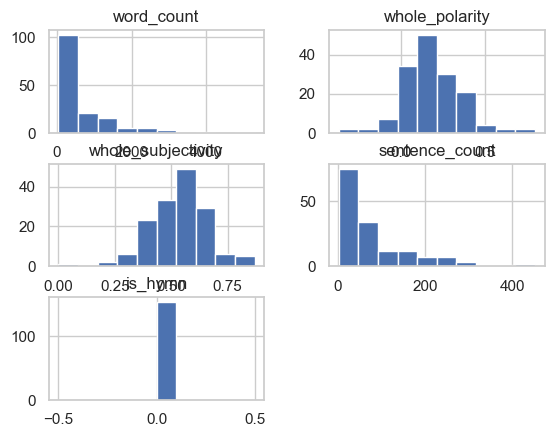

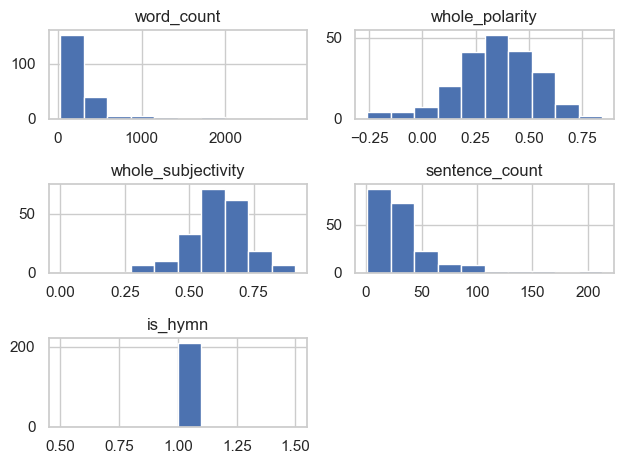

In [6]:
# Get quick histograms for descriptive statistics by 'is_hymn' to visualize distributions
df0.groupby('is_hymn').hist()
plt.tight_layout()
plt.show();

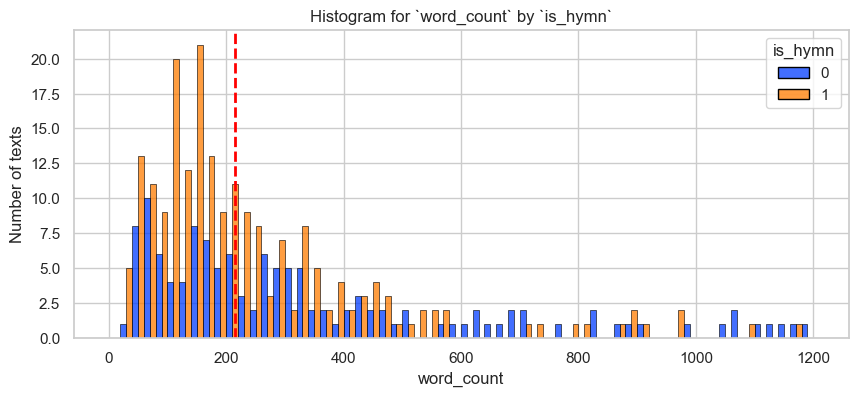

In [7]:
# Histogram for avg 'word_count' by 'is_hymn'
plt.figure(figsize=(10,4))

sns.histplot(data=df0,
             x='word_count',
             bins=range(0, 1201, 20),
             hue='is_hymn',
             palette='bright',
             edgecolor='black', 
             multiple='dodge'
             )

# Calculate median
median_value = np.median(df0['word_count'])

# Add a vertical line for median
plt.axvline(median_value, 
            color='red', 
            linestyle='dashed', 
            linewidth=2)

plt.ylabel('Number of texts')
plt.title('Histogram for `word_count` by `is_hymn`')
plt.show();

## Create new feature
Create an hstack that includes:
* A feature that encodes the frequency of `tfidf_top_word` in `text` called `top_word_freq`
* A feature that counts the frequency of 'divine power' in `lemmatized_summaries`
  * ('divine power' was the top bi-gram for all texts, see notebook ancient_NLP_weights)
* A feature that calculates the percentage of divine power in `lemmatized_summaries`
  * ('divine power' was the top bi-gram for all texts, see notebook ancient_NLP_weights)
 
An hstack is a horizontal combination of arrays
* An hstack stacks related datasets so that they can be analyzed together
 * Stacking can capture complex relationships between features that might be missed when treated separately
 * By combining related columns, the number of features is reduced (simplified model) yet essential information is retained

In [8]:
# Frequency encoding for 'tfidf_top_word'
df0['top_word_freq'] = df0.apply(lambda row: row['lemmatized_summaries'].count(row['tfidf_top_word']), axis=1)

In [9]:
# Create a feature that counts occurrences of 'divine power'
df0['divine_power_count'] = df0['lemmatized_summaries'].apply(lambda x: x.lower().count('divine power'))

In [10]:
# Create new feature 'divine_power_percent'
df0['divine_power_percent'] = df0['divine_power_count'] / df0['word_count']

In [11]:
df0.head(4)

,b_category,number,word_count,tfidf_top_word,whole_polarity,whole_subjectivity,sentence_count,is_hymn,summary,lemmatized_summaries,top_word_freq,divine_power_count,divine_power_percent
0,Narratives featuring deities,1.1.1,1440,oil like,0.330364,0.559201,167,0,pure is dilmun land. pure is dilmun land. pure...,pure dilmun land pure dilmun land pure dilmun ...,13,0,0.00000
1,Narratives featuring deities,1.1.2,825,could not,0.110600,0.449011,81,0,"in those days, in the days when heaven and ear...",day day heaven earth created night night heave...,19,0,0.00000
2,Narratives featuring deities,1.1.3,2247,placed charge,0.382723,0.596019,236,0,"grandiloquent lord of heaven and earth, self-r...",grandiloquent lord heaven earth self-reliant f...,9,0,0.00000
3,Narratives featuring deities,1.1.4,629,lapis lazuli,0.380222,0.576855,72,0,"in those remote days, when the fates were dete...",remote day fate determined year anu brought ab...,7,2,0.00318


#### Create Visuals

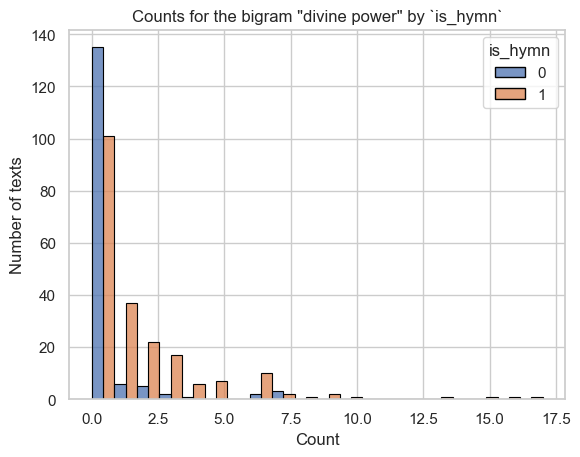

In [12]:
# Histogram for 'divine_power_count' by 'is_hymn'
sns.histplot(data=df0, x='divine_power_count', hue='is_hymn', bins=20, edgecolor='black', multiple='dodge')

# Adding labels and title
plt.xlabel('Count')
plt.ylabel('Number of texts')
plt.title('Counts for the bigram "divine power" by `is_hymn`')
plt.show();

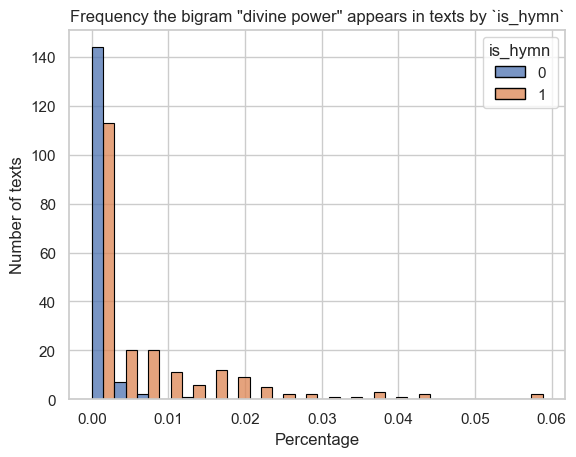

In [13]:
# Histogram for 'divine_power_percent' by 'is_hymn'
sns.histplot(data=df0, x='divine_power_percent', hue='is_hymn', bins=20, edgecolor='black', multiple='dodge')

# Adding labels and title
plt.xlabel('Percentage')
plt.ylabel('Number of texts')
plt.title('Frequency the bigram "divine power" appears in texts by `is_hymn`')
plt.show();

#### Create hstack

In [14]:
# Combine columns
bigram_freq = df0[['top_word_freq']]  

divine_power_data = csr_matrix(df0[['divine_power_count', 'divine_power_percent']].values)
X_combined = hstack([bigram_freq, divine_power_data])

In [15]:
# Convert to df
if hasattr(X_combined, 'toarray'):
    X_combined_df = pd.DataFrame(X_combined.toarray())
else:
    X_combined_df = pd.DataFrame(X_combined)

In [16]:
# Convert column names to strings
X_combined_df.columns = X_combined_df.columns.astype(str)

In [17]:
X_combined_df.reset_index(drop=True, inplace=True)

# Combine dfs X_combined_df and df0
df_combined = pd.concat([df0, X_combined_df], axis=1)

In [18]:
df_combined.head(2).round(2)

,b_category,number,word_count,tfidf_top_word,whole_polarity,whole_subjectivity,sentence_count,is_hymn,summary,lemmatized_summaries,top_word_freq,divine_power_count,divine_power_percent,0,1,2
0,Narratives featuring deities,1.1.1,1440,oil like,0.33,0.56,167,0,pure is dilmun land. pure is dilmun land. pure...,pure dilmun land pure dilmun land pure dilmun ...,13,0,0.0,13.0,0.0,0.0
1,Narratives featuring deities,1.1.2,825,could not,0.11,0.45,81,0,"in those days, in the days when heaven and ear...",day day heaven earth created night night heave...,19,0,0.0,19.0,0.0,0.0


### Drop columns

In [19]:
df_combined.columns

Index(['b_category', 'number', 'word_count', 'tfidf_top_word',
       'whole_polarity', 'whole_subjectivity', 'sentence_count', 'is_hymn',
       'summary', 'lemmatized_summaries', 'top_word_freq',
       'divine_power_count', 'divine_power_percent', '0', '1', '2'],
      dtype='object')

In [20]:
# Drop columns no longer necessary for training
df_drop = df_combined.drop(columns=['b_category',
                       'number', 
                       'tfidf_top_word',
                       'summary',
                       'top_word_freq', # now encoded in hstack
                       'divine_power_count',  # now encoded in hstack
                       'divine_power_percent' # now encoded in hstack
                     ])
df_drop.head(2).round(2)

,word_count,whole_polarity,whole_subjectivity,sentence_count,is_hymn,lemmatized_summaries,0,1,2
0,1440,0.33,0.56,167,0,pure dilmun land pure dilmun land pure dilmun ...,13.0,0.0,0.0
1,825,0.11,0.45,81,0,day day heaven earth created night night heave...,19.0,0.0,0.0


In [21]:
# Rename hstack columns
df_drop.rename(columns={'0': 'top_word_freq', '1': 'divine_power_count', '2': 'divine_power_percent'}, inplace=True)
df_drop.columns

Index(['word_count', 'whole_polarity', 'whole_subjectivity', 'sentence_count',
       'is_hymn', 'lemmatized_summaries', 'top_word_freq',
       'divine_power_count', 'divine_power_percent'],
      dtype='object')

## Check data for modelling
##### Collinearity
* Calculate variance inflation factor (VIF)
* Generate a Pearson correlation coefficient matrix

Although not a requirement for either Random Forest or gradient boosting models, calculating VIF and generating a Pearson correlation coefficient matrix can provide insights into the relationships between classifiers - therefore allowing for a greater understanding into which features are most salient, by removing those which offer similar information.

### VIF
VIF quantifies how correlated each independent variable (X) is with all the other independent variables (Xs). Or, how much the variance of each variable is inflated due to correlation with other X variables.
* A model with high variance can overfit to the observed data and generate inaccurate estimates for unseen data
* The larger the VIF, the more multicollinearity there is in the model
  * VIF of 1 = 0 correlation between the X variable & the other predictor variables (Xs) in the model
  * VIFs above 5, 10, or even 30 are considered potentially high multicollinearity

In [22]:
# Calculate variance inflation factor
# Create subset of data 
data = df_drop.drop(columns=['lemmatized_summaries', 'is_hymn'])

# Calculate variance inflation factor for each variable
vif = [variance_inflation_factor(data.values, i) 
       
       for i in range(data.shape[1])]

# Put VIF results into new df
df_vif = pd.DataFrame(vif, index = data.columns, columns=['VIF'])

df_vif.sort_values(by='VIF', ascending=False)

,VIF
sentence_count,17.319794
word_count,15.371435
whole_subjectivity,5.936446
whole_polarity,4.693799
divine_power_percent,3.011347
divine_power_count,2.782586
top_word_freq,2.060543


#### Results
* most collinearity: `sentence_count` at ~17 and `word_count` at ~15
* potential collinearity: `whole_subjectivity` at 6

### Pearson correlation coefficient matrix
A Pearson correlation coefficient value that is greater than the absolute value of 0.7, are strongly multicollinear variables and only one of these variables should be used.

In [23]:
# Generate a Pearson correlation coefficient matrix
correlation_matrix = data.corr(method='pearson', numeric_only=True)

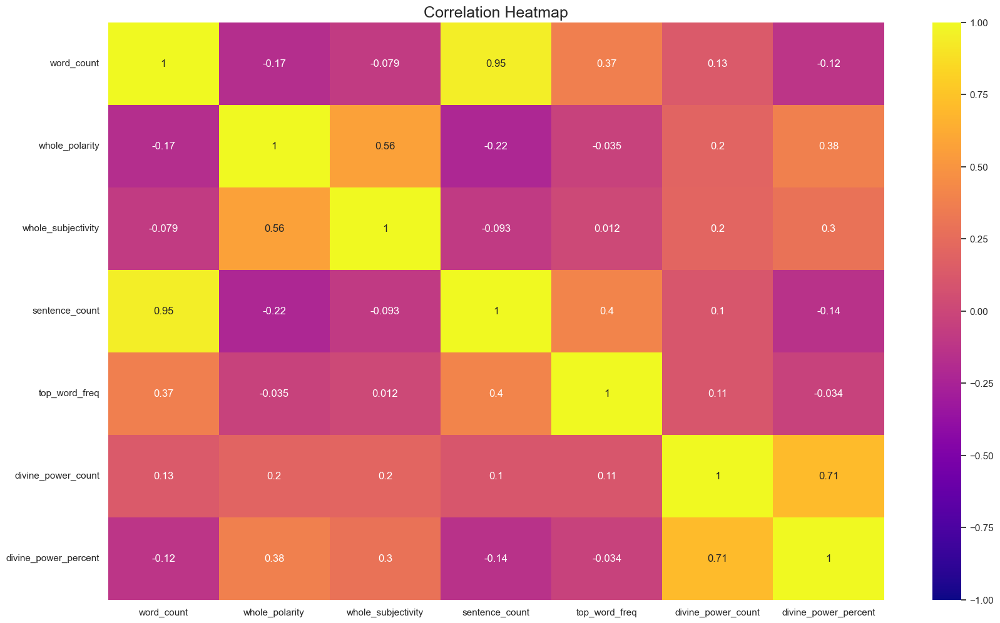

In [24]:
# Plot correlation heatmap
plt.figure(figsize=(20,12))
sns.heatmap(correlation_matrix, 
            vmin=-1, 
            vmax=1, 
            annot=True, 
            cmap='plasma')
plt.title('Correlation Heatmap',
          fontsize=18)
plt.show();

##### Results
As would be expected, `sentence_count` and `word_count` at .95 show strong multicollinearity\
`sentence_count` will be removed from X variables

`divine_power_count` and `divine_power_percent` also show some multicollinearity, but have low VIF scores so both will be kept at this stage

`whole_subjectivity` and `whole_polarity` show some multicollinearity, but both will be kept at this stage even though `whole_subjectivity` had a VIF of ~6

## Resample
Resample because when first built, neither model was particularly robust and the number of observations is rather small


In [25]:
# Copy df
df_resample = df_drop.copy()
df_resample.head(2)

,word_count,whole_polarity,whole_subjectivity,sentence_count,is_hymn,lemmatized_summaries,top_word_freq,divine_power_count,divine_power_percent
0,1440,0.330364,0.559201,167,0,pure dilmun land pure dilmun land pure dilmun ...,13.0,0.0,0.0
1,825,0.110600,0.449011,81,0,day day heaven earth created night night heave...,19.0,0.0,0.0


In [26]:
# Import packages for resampling
from sklearn.utils import resample

In [27]:
# Separate majority and minority classes
majority = df_resample[df_resample['is_hymn'] == 1]
minority = df_resample[df_resample['is_hymn'] == 0]

# Resample minority class
minority_upsampled = resample(minority,
                               replace=True,  # sample with replacement
                               n_samples=len(majority),  # match majority class
                               random_state=42)  # reproducible results

# Combine majority class with upsampled minority class
upsampled = pd.concat([majority, minority_upsampled])

# Shuffle dataset
upsampled = upsampled.sample(frac=1,  # Return entire df (not a fraction)
                             random_state=42).reset_index(drop=True) # drop=True (drop old index)

In [28]:
# Get new distribution
upsampled.is_hymn.value_counts()

is_hymn
1    210
0    210
Name: count, dtype: int64

## Recheck data for modelling

### VIF

In [29]:
# Calculate variance inflation factor
# Create subset of data 
data = upsampled.drop(columns=['lemmatized_summaries', 'is_hymn'])

# Calculate variance inflation factor for each variable
vif = [variance_inflation_factor(data.values, i) 
       
       for i in range(data.shape[1])]

# Put VIF results into new df
df_vif = pd.DataFrame(vif, index = data.columns, columns=['VIF'])

df_vif.sort_values(by='VIF', ascending=False)

,VIF
sentence_count,16.696470
word_count,15.474825
whole_subjectivity,5.258106
whole_polarity,4.078428
divine_power_percent,2.980030
divine_power_count,2.761285
top_word_freq,2.166931


### Pearson correlation coefficient matrix

In [30]:
# Generate a Pearson correlation coefficient matrix
correlation_matrix = data.corr(method='pearson', numeric_only=True)

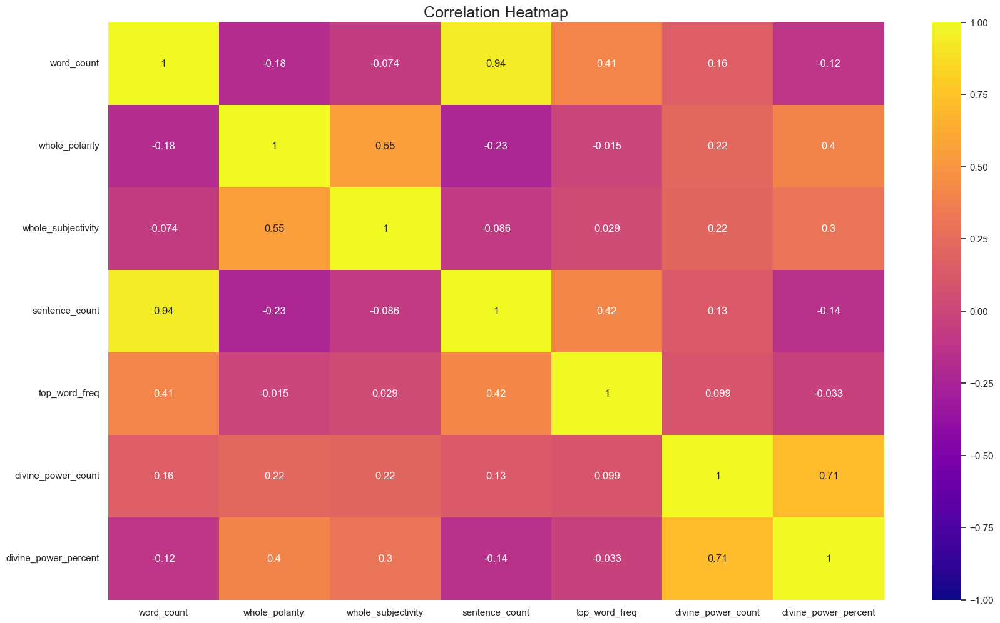

In [31]:
# Plot correlation heatmap
plt.figure(figsize=(20,12))
sns.heatmap(correlation_matrix, 
            vmin=-1, 
            vmax=1, 
            annot=True, 
            cmap='plasma')
plt.title('Correlation Heatmap',
          fontsize=18)
plt.show();

### Plot histogram for `word_count` by `is_hymn`

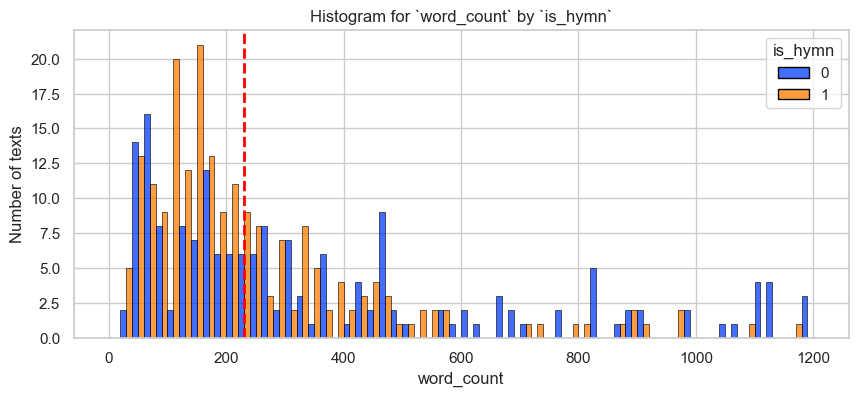

In [32]:
# Histogram for avg 'word_count' by 'is_hymn'
plt.figure(figsize=(10,4))

sns.histplot(data=upsampled,
             x='word_count',
             bins=range(0, 1201, 20),
             hue='is_hymn',
             palette='bright',
             edgecolor='black', 
             multiple='dodge'
             )

# Calculate median
median_value = np.median(upsampled['word_count'])

# Add a vertical line for median
plt.axvline(median_value, 
            color='red', 
            linestyle='dashed', 
            linewidth=2)

plt.ylabel('Number of texts')
plt.title('Histogram for `word_count` by `is_hymn`')
plt.show();

## Prepare data
Split the data into:
* features and target variable
* training data(80%) and test data(20%)
* split training data into training and validation sets to get 75/25 of 80%
* set a random seed so work can be reproduced (0)
* tokenize text column

In [33]:
# Check class balance for target variable 'is_hymn'
print(upsampled['is_hymn'].value_counts())
upsampled['is_hymn'].value_counts(normalize=True)

is_hymn
1    210
0    210
Name: count, dtype: int64


is_hymn
1    0.5
0    0.5
Name: proportion, dtype: float64

In [34]:
# Clean
df_clean = upsampled[upsampled['lemmatized_summaries'].str.strip() != '']

In [35]:
# Subset data into dependent y(target) and independent X variables
y = df_clean['is_hymn']
X = df_clean.drop(columns=['is_hymn', 'sentence_count']) 

In [36]:
# Verify number of samples in the partitioned data
print('X')
print(X.info())
print('y')
print(y.info())

X
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   word_count            420 non-null    int64  
 1   whole_polarity        420 non-null    float64
 2   whole_subjectivity    420 non-null    float64
 3   lemmatized_summaries  420 non-null    object 
 4   top_word_freq         420 non-null    float64
 5   divine_power_count    420 non-null    float64
 6   divine_power_percent  420 non-null    float64
dtypes: float64(5), int64(1), object(1)
memory usage: 23.1+ KB
None
y
<class 'pandas.core.series.Series'>
RangeIndex: 420 entries, 0 to 419
Series name: is_hymn
Non-Null Count  Dtype
--------------  -----
420 non-null    int64
dtypes: int64(1)
memory usage: 3.4 KB
None


In [37]:
# Split into train and test sets
X_tr, X_test, y_tr, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

# Split into train and validate sets
X_train, X_val, y_train, y_val = train_test_split(X_tr, y_tr, test_size=0.25, random_state=0)

In [38]:
# Get balances of each training, validation, and testing sets
X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape

((236, 7), (79, 7), (105, 7), (236,), (79,), (105,))

### Tokenization
Configure CountVectorizer to create a feature matrix that captures meaningful phrases (2-grams and 3-grams) while filtering out overly common and rare terms.

* `ngram_range=(2, 3)`: the CountVectorizer will create both 2-grams (pairs of consecutive words) and 3-grams (triples of consecutive words) from the text
* `max_df=0.70`: if an ngram appears in more than 70% of the documents, it will be excluded from the analysis in order to remove common words that might not carry significant meaning. These are generally 'stop words,' however because of the nature of the texts, removing all stop words could remove important information. Non-rare ngrams will also be filtered out so as not to clog the model.
* `min_df=0.01`: a term must appear in at least 1% of the documents to be included, so that rare terms that may not provide useful information will be filtered out and not clog the model.

In [39]:
# Set up `CountVectorizer` object to convert a collection of text into a matrix of token counts
count_vec = CountVectorizer(ngram_range=(2, 3),   # breaks each summary text into both 2-grams and 3-gram
                            max_df=0.7, # removes most frequent ngrams
                            min_df=0.01 # removes rarest ngrams
                           ) 
count_vec

,input,'content'
,encoding,'utf-8'
,decode_error,'strict'
,strip_accents,None
,lowercase,True
,preprocessor,None
,tokenizer,None
,stop_words,None
,token_pattern,'(?u)\\b\\w\\w+\\b'
,ngram_range,"(2, ...)"
,analyzer,'word'


In [40]:
# Fit vectorizer to X_train (generate ngrams) 
# Extract numerical features from `lemmatized_summaries` in X_train
count_data = count_vec.fit_transform(X_train['lemmatized_summaries']).toarray()
count_data

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(236, 8078))

In [41]:
# Place numerical representation of `lemmatized_summaries` from X_train into a df
# Use get_feature_names_out() to get sets
count_df = pd.DataFrame(data=count_data, columns=count_vec.get_feature_names_out())
count_df.head()

,aba indasa,aba indasa captain,able bite,able bite cling,able make,abomination king,abomination king father,abomination ninurta,abomination suen,abomination utu,abundance day,abundance give,abundance give population,abundance he,abundance he raised,abundance heaven,abundance heaven earth,abundance life,abundance may,abundance night,abzu edge,abzu edge horizon,abzu eridug,abzu he,abzu holy,abzu house,abzu pure,abzu she,abzu shrine,abzu you,accept curse,accept curse impossible,accept little,accept little demon,accept pleasant,accept pleasant gift,accept verdict,accept verdict possible,accepted they,accepted they looked,according tablet,according tablet not,according turning,according turning starry,accumulate good,accumulate good exalted,accumulated lie,accumulated lie honorable,accustomed demanding,accustomed demanding barley,achievement restitution,achievement restitution according,achievement task,achievement task making,adab nanna,adorned lapis,adorned lapis lazuli,adorned love,advised big,advised big men,adz chisel,adz chisel build,adz make,adz make plough,afar trip,afar trip chariot,afraid look,afraid look stone,afterwards stopped,afterwards stopped raining,agrun kug,ah god,ah god boat,ala drum,ala rudder,ala rudder broke,alcoholic drink,alert dog,alert dog not,alone he,already coming,already coming they,also owner,also owner like,although never,although never goat,although not,although not important,alum sheep,alum sheep long,always float,always float water,always service,always service enlil,always stand,always stand doorway,always stand lamentation,ama ušumgal,ama ušumgal ana,amar suena,among anuna,among anuna god,among god,among great,among great god,among great prince,among numerous,among numerous people,among people,among plant,amount he,amount he great,amount shallow,amount shallow gurgal,an ki,ana answered,ana answered dumuzid,ana aware,ana aware dumuzid,ana beloved,ana bring,ana bring sister,ana he,ana house,ana inana,ana king,ana sheepfold,ana sheepfold cow,ancestor forebear,ancestor forebear walked,ancient day,ancient time,ancient time ever,anger not,anger not see,angry heart,anoint aromatic,anoint aromatic oil,another goat,another goat butt,another one,answered always,answered always service,answered dumuzid,answered dumuzid brother,answered silver,answered silver silver,answered strong,answered strong copper,anu adab,anu adab nanna,anu beloved,anu brought,anu cursed,anu determined,anu enlil,anu enlil enki,anu enlil you,anu father,anu father god,anu gilgameš,anu great,anu he,anu holy,anu house,anu king,anu king god,anu made,anu make,anu may,anu not,anu not give,anu obscure,anu obscure place,anu owl,anu owl took,anu replied,anu word,anu you,anuna god,anuna god ninsumun,anuna god stand,anuna god whose,anuna great,anuna great god,anvil stone,anvil stone he,anyone else,anyone like,anyone like aroused,anzud bird,apart he,apple tree,appointed time,appointed you,approach cargo,approach cargo boat,approached dumuzid,approached dumuzid farmer,approached holy,approached holy sheepfold,approached house,approached house old,approached shepherd,approached shepherd shepherd,approx burden,approx burden not,approx date,approx date palm,approx fate,approx fate dog,approx father,approx father not,approx shepherd,approx shepherd shall,approx speaking,approx speaking said,approx you,ar ur,ar ur namma,arable land,arable tract,aradĝu servant,aradĝu servant say,arali dumuzid,arali dumuzid began,aratta mighty,aratta mighty man,aratta mountain,area gazelle,area gazelle not,argument huckster,argument huckster let,arm abundance,arm abundance heaven,arm bound,arm bound fetter,arm he,arm he rival,arm mother,arm mother left,arm tied,arm tied work,arm you,arm you help,aromatic cedar,aromatic oil,aromatic oil cedar,around enlil,around enlil not,around foot,around foot clattered,around like,around say,around strengthen,around strengthen pigsty,around throw,around throw stick,aroused fox,aroused fox cry,arrived you,arrived you not,arrives hang,

In [42]:
# Concatenate X_train and count_df > df `X_train_final`
X_train_final = pd.concat([X_train.drop(columns=['lemmatized_summaries']).reset_index(drop=True), count_df], axis=1)
X_train_final.head().round(2)

,word_count,whole_polarity,whole_subjectivity,top_word_freq,divine_power_count,divine_power_percent,aba indasa,aba indasa captain,able bite,able bite cling,able make,abomination king,abomination king father,abomination ninurta,abomination suen,abomination utu,abundance day,abundance give,abundance give population,abundance he,abundance he raised,abundance heaven,abundance heaven earth,abundance life,abundance may,abundance night,abzu edge,abzu edge horizon,abzu eridug,abzu he,abzu holy,abzu house,abzu pure,abzu she,abzu shrine,abzu you,accept curse,accept curse impossible,accept little,accept little demon,accept pleasant,accept pleasant gift,accept verdict,accept verdict possible,accepted they,accepted they looked,according tablet,according tablet not,according turning,according turning starry,accumulate good,accumulate good exalted,accumulated lie,accumulated lie honorable,accustomed demanding,accustomed demanding barley,achievement restitution,achievement restitution according,achievement task,achievement task making,adab nanna,adorned lapis,adorned lapis lazuli,adorned love,advised big,advised big men,adz chisel,adz chisel build,adz make,adz make plough,afar trip,afar trip chariot,afraid look,afraid look stone,afterwards stopped,afterwards stopped raining,agrun kug,ah god,ah god boat,ala drum,ala rudder,ala rudder broke,alcoholic drink,alert dog,alert dog not,alone he,already coming,already coming they,also owner,also owner like,although never,although never goat,although not,although not important,alum sheep,alum sheep long,always float,always float water,always service,always service enlil,always stand,always stand doorway,always stand lamentation,ama ušumgal,ama ušumgal ana,amar suena,among anuna,among anuna god,among god,among great,among great god,among great prince,among numerous,among numerous people,among people,among plant,amount he,amount he great,amount shallow,amount shallow gurgal,an ki,ana answered,ana answered dumuzid,ana aware,ana aware dumuzid,ana beloved,ana bring,ana bring sister,ana he,ana house,ana inana,ana king,ana sheepfold,ana sheepfold cow,ancestor forebear,ancestor forebear walked,ancient day,ancient time,ancient time ever,anger not,anger not see,angry heart,anoint aromatic,anoint aromatic oil,another goat,another goat butt,another one,answered always,answered always service,answered dumuzid,answered dumuzid brother,answered silver,answered silver silver,answered strong,answered strong copper,anu adab,anu adab nanna,anu beloved,anu brought,anu cursed,anu determined,anu enlil,anu enlil enki,anu enlil you,anu father,anu father god,anu gilgameš,anu great,anu he,anu holy,anu house,anu king,anu king god,anu made,anu make,anu may,anu not,anu not give,anu obscure,anu obscure place,anu owl,anu owl took,anu replied,anu word,anu you,anuna god,anuna god ninsumun,anuna god stand,anuna god whose,anuna great,anuna great god,anvil stone,anvil stone he,anyone else,anyone like,anyone like aroused,anzud bird,apart he,apple tree,appointed time,appointed you,approach cargo,approach cargo boat,approached dumuzid,approached dumuzid farmer,approached holy,approached holy sheepfold,approached house,approached house old,approached shepherd,approached shepherd shepherd,approx burden,approx burden not,approx date,approx date palm,approx fate,approx fate dog,approx father,approx father not,approx shepherd,approx shepherd shall,approx speaking,approx speaking said,approx you,ar ur,ar ur namma,arable land,arable tract,aradĝu servant,aradĝu servant say,arali dumuzid,arali dumuzid began,aratta mighty,aratta mighty man,aratta mountain,area gazelle,area gazelle not,argument huckster,argument huckster let,arm abundance,arm abundance heaven,arm bound,arm bound fetter,arm he,arm he rival,arm mother,arm mother left,arm tied,arm tied work,arm you,arm you help,aromatic cedar,aromatic oil,aromatic oil cedar,around enlil,around enlil not,around foot,around foot clattered,around like,around say,around strengthen,around strengthen pigsty,ar

In [43]:
# Extract numerical features from `lemmatized_summaries` in X_val
validation_count_data = count_vec.transform(X_val['lemmatized_summaries']).toarray()
validation_count_data

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(79, 8078))

In [44]:
# Place numerical representation of `lemmatized_summaries` from X_val into a df
validation_count_df = pd.DataFrame(data=validation_count_data, columns=count_vec.get_feature_names_out())
validation_count_df.head()

,aba indasa,aba indasa captain,able bite,able bite cling,able make,abomination king,abomination king father,abomination ninurta,abomination suen,abomination utu,abundance day,abundance give,abundance give population,abundance he,abundance he raised,abundance heaven,abundance heaven earth,abundance life,abundance may,abundance night,abzu edge,abzu edge horizon,abzu eridug,abzu he,abzu holy,abzu house,abzu pure,abzu she,abzu shrine,abzu you,accept curse,accept curse impossible,accept little,accept little demon,accept pleasant,accept pleasant gift,accept verdict,accept verdict possible,accepted they,accepted they looked,according tablet,according tablet not,according turning,according turning starry,accumulate good,accumulate good exalted,accumulated lie,accumulated lie honorable,accustomed demanding,accustomed demanding barley,achievement restitution,achievement restitution according,achievement task,achievement task making,adab nanna,adorned lapis,adorned lapis lazuli,adorned love,advised big,advised big men,adz chisel,adz chisel build,adz make,adz make plough,afar trip,afar trip chariot,afraid look,afraid look stone,afterwards stopped,afterwards stopped raining,agrun kug,ah god,ah god boat,ala drum,ala rudder,ala rudder broke,alcoholic drink,alert dog,alert dog not,alone he,already coming,already coming they,also owner,also owner like,although never,although never goat,although not,although not important,alum sheep,alum sheep long,always float,always float water,always service,always service enlil,always stand,always stand doorway,always stand lamentation,ama ušumgal,ama ušumgal ana,amar suena,among anuna,among anuna god,among god,among great,among great god,among great prince,among numerous,among numerous people,among people,among plant,amount he,amount he great,amount shallow,amount shallow gurgal,an ki,ana answered,ana answered dumuzid,ana aware,ana aware dumuzid,ana beloved,ana bring,ana bring sister,ana he,ana house,ana inana,ana king,ana sheepfold,ana sheepfold cow,ancestor forebear,ancestor forebear walked,ancient day,ancient time,ancient time ever,anger not,anger not see,angry heart,anoint aromatic,anoint aromatic oil,another goat,another goat butt,another one,answered always,answered always service,answered dumuzid,answered dumuzid brother,answered silver,answered silver silver,answered strong,answered strong copper,anu adab,anu adab nanna,anu beloved,anu brought,anu cursed,anu determined,anu enlil,anu enlil enki,anu enlil you,anu father,anu father god,anu gilgameš,anu great,anu he,anu holy,anu house,anu king,anu king god,anu made,anu make,anu may,anu not,anu not give,anu obscure,anu obscure place,anu owl,anu owl took,anu replied,anu word,anu you,anuna god,anuna god ninsumun,anuna god stand,anuna god whose,anuna great,anuna great god,anvil stone,anvil stone he,anyone else,anyone like,anyone like aroused,anzud bird,apart he,apple tree,appointed time,appointed you,approach cargo,approach cargo boat,approached dumuzid,approached dumuzid farmer,approached holy,approached holy sheepfold,approached house,approached house old,approached shepherd,approached shepherd shepherd,approx burden,approx burden not,approx date,approx date palm,approx fate,approx fate dog,approx father,approx father not,approx shepherd,approx shepherd shall,approx speaking,approx speaking said,approx you,ar ur,ar ur namma,arable land,arable tract,aradĝu servant,aradĝu servant say,arali dumuzid,arali dumuzid began,aratta mighty,aratta mighty man,aratta mountain,area gazelle,area gazelle not,argument huckster,argument huckster let,arm abundance,arm abundance heaven,arm bound,arm bound fetter,arm he,arm he rival,arm mother,arm mother left,arm tied,arm tied work,arm you,arm you help,aromatic cedar,aromatic oil,aromatic oil cedar,around enlil,around enlil not,around foot,around foot clattered,around like,around say,around strengthen,around strengthen pigsty,around throw,around throw stick,aroused fox,aroused fox cry,arrived you,arrived you not,arrives hang,

In [45]:
# Concatenate `X_val` and `lemmatized` > df `X_val_final`
X_val_final = pd.concat([X_val.drop(columns=['lemmatized_summaries']).reset_index(drop=True), validation_count_df], axis=1)
X_val_final.head().round(2)

,word_count,whole_polarity,whole_subjectivity,top_word_freq,divine_power_count,divine_power_percent,aba indasa,aba indasa captain,able bite,able bite cling,able make,abomination king,abomination king father,abomination ninurta,abomination suen,abomination utu,abundance day,abundance give,abundance give population,abundance he,abundance he raised,abundance heaven,abundance heaven earth,abundance life,abundance may,abundance night,abzu edge,abzu edge horizon,abzu eridug,abzu he,abzu holy,abzu house,abzu pure,abzu she,abzu shrine,abzu you,accept curse,accept curse impossible,accept little,accept little demon,accept pleasant,accept pleasant gift,accept verdict,accept verdict possible,accepted they,accepted they looked,according tablet,according tablet not,according turning,according turning starry,accumulate good,accumulate good exalted,accumulated lie,accumulated lie honorable,accustomed demanding,accustomed demanding barley,achievement restitution,achievement restitution according,achievement task,achievement task making,adab nanna,adorned lapis,adorned lapis lazuli,adorned love,advised big,advised big men,adz chisel,adz chisel build,adz make,adz make plough,afar trip,afar trip chariot,afraid look,afraid look stone,afterwards stopped,afterwards stopped raining,agrun kug,ah god,ah god boat,ala drum,ala rudder,ala rudder broke,alcoholic drink,alert dog,alert dog not,alone he,already coming,already coming they,also owner,also owner like,although never,although never goat,although not,although not important,alum sheep,alum sheep long,always float,always float water,always service,always service enlil,always stand,always stand doorway,always stand lamentation,ama ušumgal,ama ušumgal ana,amar suena,among anuna,among anuna god,among god,among great,among great god,among great prince,among numerous,among numerous people,among people,among plant,amount he,amount he great,amount shallow,amount shallow gurgal,an ki,ana answered,ana answered dumuzid,ana aware,ana aware dumuzid,ana beloved,ana bring,ana bring sister,ana he,ana house,ana inana,ana king,ana sheepfold,ana sheepfold cow,ancestor forebear,ancestor forebear walked,ancient day,ancient time,ancient time ever,anger not,anger not see,angry heart,anoint aromatic,anoint aromatic oil,another goat,another goat butt,another one,answered always,answered always service,answered dumuzid,answered dumuzid brother,answered silver,answered silver silver,answered strong,answered strong copper,anu adab,anu adab nanna,anu beloved,anu brought,anu cursed,anu determined,anu enlil,anu enlil enki,anu enlil you,anu father,anu father god,anu gilgameš,anu great,anu he,anu holy,anu house,anu king,anu king god,anu made,anu make,anu may,anu not,anu not give,anu obscure,anu obscure place,anu owl,anu owl took,anu replied,anu word,anu you,anuna god,anuna god ninsumun,anuna god stand,anuna god whose,anuna great,anuna great god,anvil stone,anvil stone he,anyone else,anyone like,anyone like aroused,anzud bird,apart he,apple tree,appointed time,appointed you,approach cargo,approach cargo boat,approached dumuzid,approached dumuzid farmer,approached holy,approached holy sheepfold,approached house,approached house old,approached shepherd,approached shepherd shepherd,approx burden,approx burden not,approx date,approx date palm,approx fate,approx fate dog,approx father,approx father not,approx shepherd,approx shepherd shall,approx speaking,approx speaking said,approx you,ar ur,ar ur namma,arable land,arable tract,aradĝu servant,aradĝu servant say,arali dumuzid,arali dumuzid began,aratta mighty,aratta mighty man,aratta mountain,area gazelle,area gazelle not,argument huckster,argument huckster let,arm abundance,arm abundance heaven,arm bound,arm bound fetter,arm he,arm he rival,arm mother,arm mother left,arm tied,arm tied work,arm you,arm you help,aromatic cedar,aromatic oil,aromatic oil cedar,around enlil,around enlil not,around foot,around foot clattered,around like,around say,around strengthen,around strengthen pigsty,ar

In [46]:
# Extract numerical features from `lemmatized_summaries` in X_test
test_count_data = count_vec.transform(X_test['lemmatized_summaries']).toarray()

# Place numerical representation of `lemmatized_summaries` from X_test into df 
test_count_df = pd.DataFrame(data=test_count_data, columns=count_vec.get_feature_names_out())

# Concatenate `X_test` and `lemmatized_summaries` > df X_test_final
X_test_final = pd.concat([X_test.drop(columns=['lemmatized_summaries']).reset_index(drop=True), test_count_df], axis=1)
X_test_final.head().round(2)

,word_count,whole_polarity,whole_subjectivity,top_word_freq,divine_power_count,divine_power_percent,aba indasa,aba indasa captain,able bite,able bite cling,able make,abomination king,abomination king father,abomination ninurta,abomination suen,abomination utu,abundance day,abundance give,abundance give population,abundance he,abundance he raised,abundance heaven,abundance heaven earth,abundance life,abundance may,abundance night,abzu edge,abzu edge horizon,abzu eridug,abzu he,abzu holy,abzu house,abzu pure,abzu she,abzu shrine,abzu you,accept curse,accept curse impossible,accept little,accept little demon,accept pleasant,accept pleasant gift,accept verdict,accept verdict possible,accepted they,accepted they looked,according tablet,according tablet not,according turning,according turning starry,accumulate good,accumulate good exalted,accumulated lie,accumulated lie honorable,accustomed demanding,accustomed demanding barley,achievement restitution,achievement restitution according,achievement task,achievement task making,adab nanna,adorned lapis,adorned lapis lazuli,adorned love,advised big,advised big men,adz chisel,adz chisel build,adz make,adz make plough,afar trip,afar trip chariot,afraid look,afraid look stone,afterwards stopped,afterwards stopped raining,agrun kug,ah god,ah god boat,ala drum,ala rudder,ala rudder broke,alcoholic drink,alert dog,alert dog not,alone he,already coming,already coming they,also owner,also owner like,although never,although never goat,although not,although not important,alum sheep,alum sheep long,always float,always float water,always service,always service enlil,always stand,always stand doorway,always stand lamentation,ama ušumgal,ama ušumgal ana,amar suena,among anuna,among anuna god,among god,among great,among great god,among great prince,among numerous,among numerous people,among people,among plant,amount he,amount he great,amount shallow,amount shallow gurgal,an ki,ana answered,ana answered dumuzid,ana aware,ana aware dumuzid,ana beloved,ana bring,ana bring sister,ana he,ana house,ana inana,ana king,ana sheepfold,ana sheepfold cow,ancestor forebear,ancestor forebear walked,ancient day,ancient time,ancient time ever,anger not,anger not see,angry heart,anoint aromatic,anoint aromatic oil,another goat,another goat butt,another one,answered always,answered always service,answered dumuzid,answered dumuzid brother,answered silver,answered silver silver,answered strong,answered strong copper,anu adab,anu adab nanna,anu beloved,anu brought,anu cursed,anu determined,anu enlil,anu enlil enki,anu enlil you,anu father,anu father god,anu gilgameš,anu great,anu he,anu holy,anu house,anu king,anu king god,anu made,anu make,anu may,anu not,anu not give,anu obscure,anu obscure place,anu owl,anu owl took,anu replied,anu word,anu you,anuna god,anuna god ninsumun,anuna god stand,anuna god whose,anuna great,anuna great god,anvil stone,anvil stone he,anyone else,anyone like,anyone like aroused,anzud bird,apart he,apple tree,appointed time,appointed you,approach cargo,approach cargo boat,approached dumuzid,approached dumuzid farmer,approached holy,approached holy sheepfold,approached house,approached house old,approached shepherd,approached shepherd shepherd,approx burden,approx burden not,approx date,approx date palm,approx fate,approx fate dog,approx father,approx father not,approx shepherd,approx shepherd shall,approx speaking,approx speaking said,approx you,ar ur,ar ur namma,arable land,arable tract,aradĝu servant,aradĝu servant say,arali dumuzid,arali dumuzid began,aratta mighty,aratta mighty man,aratta mountain,area gazelle,area gazelle not,argument huckster,argument huckster let,arm abundance,arm abundance heaven,arm bound,arm bound fetter,arm he,arm he rival,arm mother,arm mother left,arm tied,arm tied work,arm you,arm you help,aromatic cedar,aromatic oil,aromatic oil cedar,around enlil,around enlil not,around foot,around foot clattered,around like,around say,around strengthen,around strengthen pigsty,ar

In [47]:
# Get balances of each training, validation, & testing sets
X_train_final.shape, X_val_final.shape, X_test_final.shape, y_train.shape, y_val.shape, y_test.shape

((236, 8084), (79, 8084), (105, 8084), (236,), (79,), (105,))

In [48]:
print(test_count_data[:5])  # Display the first 5 rows of feature array

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [49]:
print(np.isnan(test_count_data).any())  # Check for NaN values
print(np.isinf(test_count_data).any())  # Check for infinite values

False
False


In [50]:
# Check data type of feature array
test_count_data.dtype

dtype('int64')

## Build random forest model
* Instantiate RF model
* Cross-validated hyperparameter tuning:
  * Create a dictionary of hyperparameters to search over
* Create a dictionary of scoring metrics to capture

In [51]:
# Instantiate Random Forest classifier
rf = RandomForestClassifier(random_state=42)

# Determine set of hyperparameters
cv_params = {'max_depth': [5, 7, None],
             'max_features': [0.3, 0.6],
             'max_samples': [0.7],
             'min_samples_leaf': [1, 2], 
             'min_samples_split': [2, 3], # small fractional values can help capture patterns in minority classes 
                                          # fixed values (like 4) can prevent the creation of very small nodes that could lead to overfitting on the majority class
             'n_estimators': [75, 100, 200], # how deep trees are allowed to grow
             }

# Define scoring criteria
scoring = ['accuracy', 'precision', 'recall', 'f1']

### Instantiate the GridSearchCV object
* construct GridSearch cross-validation
* fit model to training data
* cv=5: cross-validation folds
* fit model to training data

##### Choosing evaluation metric (refit)
The scoring metric that GridSearch will use when it selects the model that performs best on average over all validation folds 

*Accuracy* could be misleading if the data set is unbalanced. Model could get a high accuracy score even if only one outcome is well classified. This data set isn't too imbalanced, so may not be a problem.

*Precision* measures the accuracy of positive classifications (true positives / true positives + false positives).<br>
Using precision as a metric could be problematic because in an effort to be more precise in classifying correctly, the model may become more selective leading to more false-negative/Type II errors. Thus, hymns could be missed.

*Recall (or Sensitivity)* measures the ability of the model to find *all* relevant cases (true positives/ true positives + false negatives).<br>
Using this metric, the model is more sensitive to classifying hymns and can then incorrectly classify non-hymn as hymns leading to more false-positive/Type I errors).

*F1* balances both recall and precision, but here concentrating on recall would be more productive

Will use recall at first to see how many it can classify

In [52]:
# Instantiate GridSearchCV object
# refit: use recall as metric
RF_NLP_train = GridSearchCV(rf, 
                            cv_params, 
                            scoring=scoring, 
                            cv=5, 
                            refit='recall')

In [53]:
# Fit model to the training data & call magic function time to time execution
%time
RF_NLP_train.fit(X_train_final, y_train)

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 4.05 μs


,estimator,RandomForestC...ndom_state=42)
,param_grid,"{'max_depth': [5, 7, ...], 'max_features': [0.3, 0.6], 'max_samples': [0.7], 'min_samples_leaf': [1, 2], ...}"
,scoring,"['accuracy', 'precision', ...]"
,n_jobs,None
,refit,'recall'
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,n_estimators,200


In [54]:
# Examine best average score across all validation folds
RF_NLP_train.best_score_

np.float64(0.798)

In [55]:
# Examine best combination of hyperparameters
RF_NLP_train.best_params_

{'max_depth': None,
 'max_features': 0.3,
 'max_samples': 0.7,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 200}

In [56]:
# Get parameters for function 'model_results'
help(model_results)

Help on function model_results in module model_scores:

model_results(model_name: str, model_object, metric: str)
    model_results extracts and summarizes model performance metrics from a fitted GridSearchCV object
    
    Parameters:
    model_name (str): name of model being evaluated
    model_object: a fitted GridSearchCV object containing cross-validation results
    metric (str): metric to evaluate ('precision', 'recall', 'f1', 'accuracy')
    
    Returns:
    pd.DataFrame: a DataFrame containing the model name and its corresponding performance metrics



In [57]:
# Pass GridSearch object to 'model_results' function.
RF_NLP_train_results = model_results('Random Forest train', RF_NLP_train, 'recall')
RF_NLP_train_results

,Model,Precision,Recall,Accuracy,F1
0,Random Forest train,0.839649,0.798,0.813652,0.815247


#### Create results table

In [58]:
# Save results table as csv
RF_NLP_train_results.to_csv('Ancient_Results.csv', index=False) # index=False to remove indexing row

In [59]:
# View results
results_table = pd.read_csv('Ancient_Results.csv')
results_table

,Model,Precision,Recall,Accuracy,F1
0,Random Forest train,0.839649,0.798,0.813652,0.815247


### Use RF model with validation set

In [60]:
# Use Random Forest model to predict on validation data with best tree
RF_NLP_val_preds = RF_NLP_train.best_estimator_.predict(X_val_final) # retrieve best Random Forest tree

In [61]:
# Get parameters for function 'get_val_scores'
help(get_val_scores)

Help on function get_val_scores in module model_scores:

get_val_scores(model_name: str, preds, y_val_data)
    get_val_scores calculates validation scores for a model and returns them in a DataFrame
    
    Parameters:
    model_name (str): name of model being evaluated
    preds: predictions made by model
    y_val_data: true labels for validation dataset
    
    Returns:
    pd.DataFrame: A DataFrame containing the model name and its corresponding validation scores



In [62]:
# Pass scores to 'get_val_scores' function
RF_NLP_val = get_val_scores('Random Forest val', RF_NLP_val_preds, y_val)
RF_NLP_val

,Model,Precision,Recall,Accuracy,F1
0,Random Forest val,0.902439,0.902439,0.898734,0.902439


#### Add to master results table

In [63]:
# Read in master results table
results_table = pd.read_csv('Ancient_Results.csv')
results_table

,Model,Precision,Recall,Accuracy,F1
0,Random Forest train,0.839649,0.798,0.813652,0.815247


In [64]:
# Concatenate RF_NLP_val model results table with master results table
results_table2 = pd.concat([results_table, RF_NLP_val])
results_table2

,Model,Precision,Recall,Accuracy,F1
0,Random Forest train,0.839649,0.798000,0.813652,0.815247
0,Random Forest val,0.902439,0.902439,0.898734,0.902439


In [65]:
# Save master results table
results_table2.to_csv('Ancient_Results.csv', index=False)

In [66]:
# View results
results_table2 = pd.read_csv('Ancient_Results.csv')
results_table2

,Model,Precision,Recall,Accuracy,F1
0,Random Forest train,0.839649,0.798000,0.813652,0.815247
1,Random Forest val,0.902439,0.902439,0.898734,0.902439


### Create a confusion matrix
A confusion matrix (CM) evaluates the model's performance on unseen data, in order to help assess how well the model generalizes to new examples

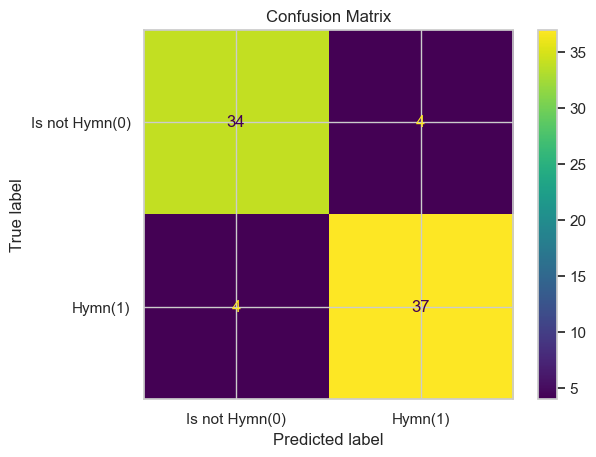

In [67]:
# Create confusion matrix to visualize how accurate classifier is at predicting labels for a categorical variable
cm = confusion_matrix(y_val, RF_NLP_val_preds, labels=RF_NLP_train.classes_)

# Visualize confusion matrix
RF_NLP_disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels=['Is not Hymn(0)', 'Hymn(1)'])
RF_NLP_disp.plot()
plt.title('Confusion Matrix');

In [68]:
# Get shape of testing set
X_val.shape, y_val.shape

((79, 7), (79,))

#### Legend
* True label (y_val): actual labels of the holdout sample
* Predicted label (RF_NLP_val_preds): classified labels ('Is not Hymn(0)'/'Hymn(1)') on the holdout test sample

Since this is a binomial classification, there are only two classifications:
* 0 = the text was classified as not a hymn for that observation
* 1 = the text was classified as a hymn for that observation

*Translation*
> True Negatives(UL): # of 'Is not Hymn(0)' that the model accurately classified as 'Is not Hymn(0)' = 34 <br>
> True Positives(LR): # of 'Hymn(1)' that the model accurately classified 'Hymn(1)' = 37

> False Positives(UR)/Type I Errors: # of 'Is not Hymn(0)' that the model classified were 'Hymn(1)' = 4 <br>
> False Negatives(LL)/Type II Errors: # of 'Hymn(1)' that the model classified were 'Is not Hymn(0)' = 4

In choosing 'recall' as the metric, the model classified 4 non-hymns as hymns, in its attempt to find all hymns. This made for a very robust model with a 90% recall score.

### Plot ROC Curve and AOC

#### ROC
**The Receiver Operating Characteristic (ROC)** curve visualizes the performance of a classifier at different classification thresholds
* For binary classification: a classification threshold is a cutoff(point) for differentiating the positive class from the negative class
  * y axis: True Positive Rate (Recall). The probability that model classifies a positive and it is negative (Sensitivity).
  * X axis: False Positive Rate (= False Positives / (False Positives + True Negatives)). The probability that model classifies a negative and it is negative (Specificity)

In [69]:
# Get predicted probabilities for the positive class
RF_NLP_val_preds = RF_NLP_train.best_estimator_.predict_proba(X_val_final)[:, 1] # 1 = positive class

/opt/anaconda3/envs/mystats/lib/python3.10/site-packages/sklearn/utils/_plotting.py:175: FutureWarning: `**kwargs` is deprecated and will be removed in 1.9. Pass all matplotlib arguments to `curve_kwargs` as a dictionary instead.
  warnings.warn(


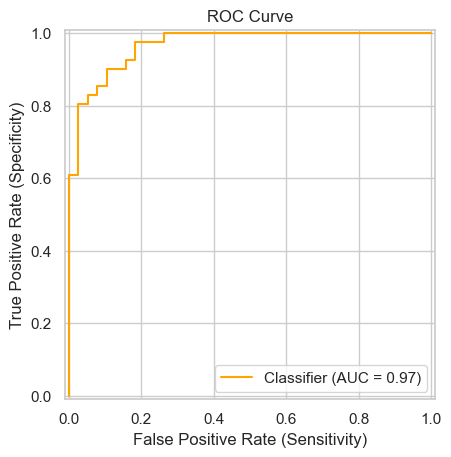

In [70]:
# Plot the ROC Curve
RocCurveDisplay.from_predictions(y_val, RF_NLP_val_preds, color='orange')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate (Sensitivity)')
plt.ylabel('True Positive Rate (Specificity)')
plt.show()

#### AUC
**The Area Under the Curve (AUC)** provides an aggregate measure of performance of the model at each threshold.
* A model that has an AUC score of 0.0 is entirely wrong A model that has an AUC score of 1.0 is entirely correct
  * A model that has an AUC score of < 0.5 is a model that performs worse than random classification
  * A model that has an AUC score of > 0.5 is a model that performs better than random classification

In [71]:
# Calculate the AUC
auc_score = roc_auc_score(y_val, RF_NLP_val_preds)
print(f'AUC: {auc_score:.4f}') 

AUC: 0.9673


#### Results
At first (point (0, 0.6)), the model is performing OK at this threshold with the true positive rate at ~60%.

As the curve moves to (0.1, 0.9) and then (0.28, 1.0), the model learns that increasing the false positive rate also increases the true positive rate (improved classifier performance).

By point (0.4, 1.0) with a relatively high false positive rate, the model is able to identify all positive instances (~100%). However, the false positive rate continues to climb, where ultimately, all of the actual negative instances are incorrectly classified as positive.

The AUC score at 0.97 is very robust, indicating that the classifier can effectively distinguish between the positive and negative classes, but this comes at the cost of a high rate of false positives.

### Visualize feature importances

In [72]:
# Calculate feature importance 
importances = RF_NLP_train.best_estimator_.feature_importances_
feature_importances = pd.Series(importances, index=X_val_final.columns).sort_values(ascending=False)

feature_importances = pd.DataFrame(pd.Series(importances, index=X_val_final.columns).sort_values(ascending=False))

In [73]:
top_15_features = feature_importances.head(15)
top_15_features

,0
whole_polarity,0.140924
divine_power_percent,0.099282
you not,0.076078
whole_subjectivity,0.074570
word_count,0.064145
divine power,0.030614
divine_power_count,0.029807
top_word_freq,0.019433
may you,0.009581
šir namšub,0.007385


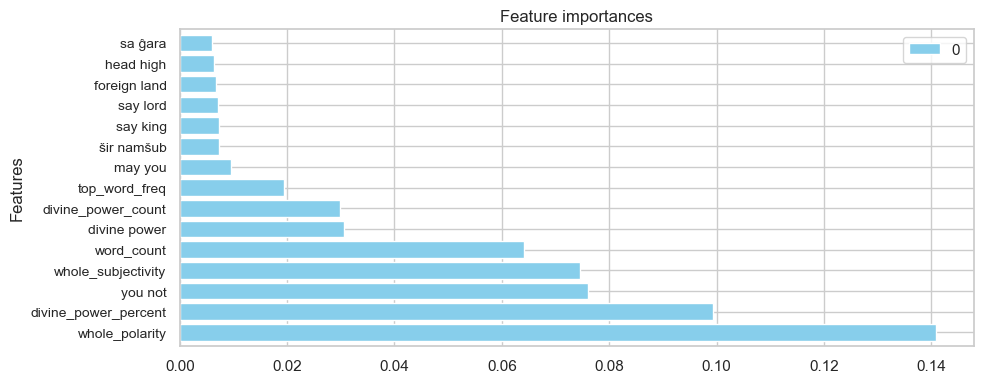

In [74]:
# Plot feature importance 
fig, ax = plt.subplots(figsize=(10, 4))
top_15_features.plot.barh(ax=ax, width=0.8, color='skyblue') 
ax.set_title('Feature importances')
ax.set_ylabel('Features')

ax.tick_params(axis='y', labelsize=10)

plt.tight_layout()
plt.show()

### Most Important features
According to the Random Forest feature importance plot in classifying it as either 'is_hymn = 0' or 'is_hymn = 1':
* The most predictive feature was `whole_polarity`
* The second most important was the percentage the bigram "divine power" appeared in a text (`divine_power_percent`)
* Almost tied in imortance were the bigram "you not", `whole_subjectivity`, and `word_count`

It is interesting that the count for "divine power" was not nearly as salient (`divine_power_count`). Nor was the bigram feature `divine power`.

The least predictive of the top 15 features were also interesting. They were the bigrams "foreign land" and "head high", and the compositional notation "sa ĝara".

## Build an XGBoost Model

In [75]:
# Instantiate XGBoost classifier
xgb = XGBClassifier(objective='binary:logistic', random_state=42)

# Determine set of hyperparameters
cv_params = {'max_depth': [4,8,12],
             'min_child_weight': [3, 5],
             'learning_rate': [0.01, 0.1],
             'n_estimators': [300, 500]
             }

# Define scoring criteria
scoring = ['accuracy', 'precision', 'recall', 'f1']

In [76]:
# Instantiate GridSearchCV object
# refit: use recall as metric
XGB_NLP_train = GridSearchCV(xgb, cv_params, scoring=scoring, cv=5, refit='recall')

In [77]:
# Fit model to X_train_final and y_train data 
%time
XGB_NLP_train.fit(X_train_final, y_train)

CPU times: user 2 μs, sys: 0 ns, total: 2 μs
Wall time: 4.05 μs


,estimator,"XGBClassifier...ree=None, ...)"
,param_grid,"{'learning_rate': [0.01, 0.1], 'max_depth': [4, 8, ...], 'min_child_weight': [3, 5], 'n_estimators': [300, 500]}"
,scoring,"['accuracy', 'precision', ...]"
,n_jobs,None
,refit,'recall'
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,objective,'binary:logistic'


In [78]:
# Examine best score
XGB_NLP_train.best_score_

np.float64(0.805)

In [79]:
# Examine best parameters
XGB_NLP_train.best_params_

{'learning_rate': 0.1,
 'max_depth': 8,
 'min_child_weight': 3,
 'n_estimators': 500}

In [80]:
# Pass GridSearch object to model_results() function.
XGB_NLP_train_results = model_results('XGBoost train', XGB_NLP_train, 'recall')
XGB_NLP_train_results

,Model,Precision,Recall,Accuracy,F1
0,XGBoost train,0.824551,0.805,0.809309,0.814573


#### Add to master results table

In [81]:
# Concatenate XGBoost model results table with master results table
results_table3 = pd.concat([results_table2, XGB_NLP_train_results])
results_table3

,Model,Precision,Recall,Accuracy,F1
0,Random Forest train,0.839649,0.798000,0.813652,0.815247
1,Random Forest val,0.902439,0.902439,0.898734,0.902439
0,XGBoost train,0.824551,0.805000,0.809309,0.814573


In [82]:
# Save master results table
results_table3.to_csv('Ancient_Results.csv', index = False) 

In [83]:
# View the results
results_table3 = pd.read_csv('Ancient_Results.csv')
results_table3 = results_table3.sort_values(by=['Recall'], ascending=False)
results_table3.head()

,Model,Precision,Recall,Accuracy,F1
1,Random Forest val,0.902439,0.902439,0.898734,0.902439
2,XGBoost train,0.824551,0.805000,0.809309,0.814573
0,Random Forest train,0.839649,0.798000,0.813652,0.815247


### Use XGB model with validation set

In [84]:
# Use XGBoost model to predict on validation data with best tree
XGB_NLP_val_preds = XGB_NLP_train.best_estimator_.predict(X_val_final)

In [85]:
# Pass scores to get_val_scores function 
XGB_NLP_val = get_val_scores('XGBoost val', XGB_NLP_val_preds, y_val)
XGB_NLP_val

,Model,Precision,Recall,Accuracy,F1
0,XGBoost val,0.926829,0.926829,0.924051,0.926829


#### Add to master results table

In [86]:
# Concatenate XGB_NLP_val model results table with master results table
results_table4 = pd.concat([results_table3, XGB_NLP_val])
results_table4

,Model,Precision,Recall,Accuracy,F1
1,Random Forest val,0.902439,0.902439,0.898734,0.902439
2,XGBoost train,0.824551,0.805000,0.809309,0.814573
0,Random Forest train,0.839649,0.798000,0.813652,0.815247
0,XGBoost val,0.926829,0.926829,0.924051,0.926829


In [87]:
# Save master results table
results_table4.to_csv('Ancient_Results.csv', index = False) 

In [88]:
# View results
results_table4 = pd.read_csv('Ancient_Results.csv')
results_table4 = results_table4.sort_values(by=['Recall'], ascending=False)
results_table4.head()

,Model,Precision,Recall,Accuracy,F1
3,XGBoost val,0.926829,0.926829,0.924051,0.926829
0,Random Forest val,0.902439,0.902439,0.898734,0.902439
1,XGBoost train,0.824551,0.805000,0.809309,0.814573
2,Random Forest train,0.839649,0.798000,0.813652,0.815247


### Create a confusion matrix

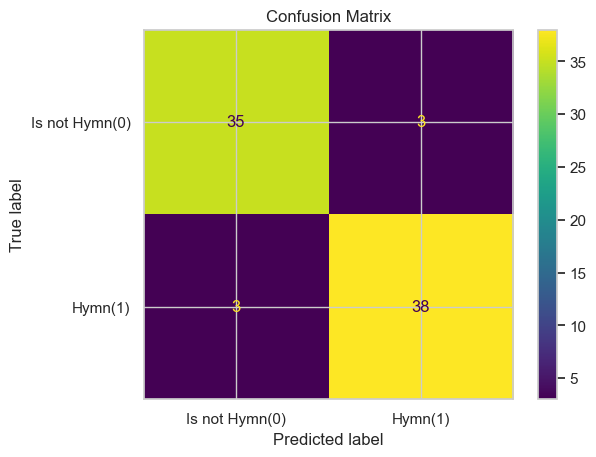

In [89]:
# Create confusion matrix to visualize how accurate classifier is at predicting the labels for a categorical variable
cm = confusion_matrix(y_val, XGB_NLP_val_preds, labels=XGB_NLP_train.classes_)

# Visualize with confusion matrix
XGB_NLP_disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels=['Is not Hymn(0)', 'Hymn(1)'])
XGB_NLP_disp.plot()
plt.title('Confusion Matrix');

#### Results
The XGBoost model performed slightly better than the Random Forest model on both the training and validation sets

> True Negatives(UL): # of 'Is not Hymn(0)' that the model accurately classified as 'Is not Hymn(0)' = 35 <br>
> True Positives(LR): # of 'Hymn(1)' that the model accurately classified 'Hymn(1)' = 38

> False Positives(UR)/Type I Errors: # of 'Is not Hymn(0)' that the model classified were 'Hymn(1)' = 3 <br>
> False Negatives(LL)/Type II Errors: # of 'Hymn(1)' that the model classified were 'Is not Hymn(0)' = 3

In choosing 'recall' as the metric, the model classified only 3 non-hymns as hymns, in its attempt to find all hymns. This made for an even more robust model with a 93% recall score.

### Plot ROC and AOC

In [90]:
# Get predicted probabilities for the positive class
XGB_NLP_val_preds = XGB_NLP_train.best_estimator_.predict_proba(X_val_final)[:, 1] # 1 = positive class

/opt/anaconda3/envs/mystats/lib/python3.10/site-packages/sklearn/utils/_plotting.py:175: FutureWarning: `**kwargs` is deprecated and will be removed in 1.9. Pass all matplotlib arguments to `curve_kwargs` as a dictionary instead.
  warnings.warn(


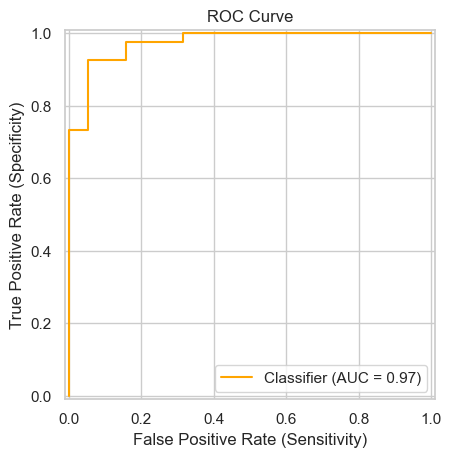

In [91]:
# Plot ROC Curve
RocCurveDisplay.from_predictions(y_val, XGB_NLP_val_preds, color='orange')
plt.title('ROC Curve')
plt.xlabel('False Positive Rate (Sensitivity)')
plt.ylabel('True Positive Rate (Specificity)')
plt.show()

In [92]:
# Calculate the AUC
auc_score = roc_auc_score(y_val, XGB_NLP_val_preds)
print(f'AUC: {auc_score:.4f}') 

AUC: 0.9743


#### Results
With an AUC of 98%, the XGBoost model was slightly better at classifying texts correctly than the Random Forest model (97%)

### Plot feature importance

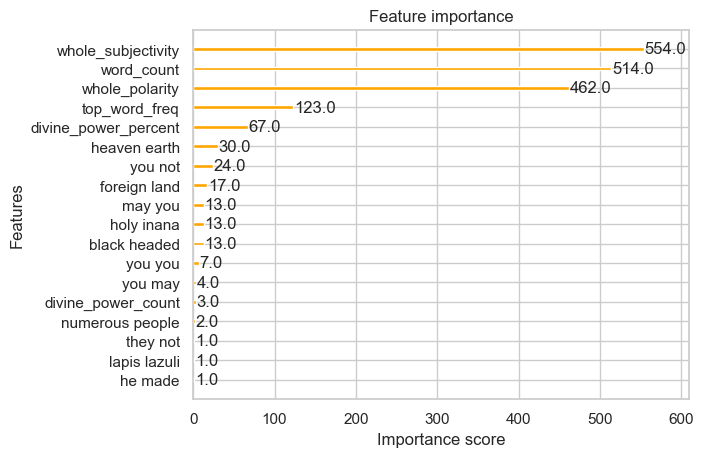

In [93]:
plot_importance(XGB_NLP_train.best_estimator_, color ='orange')
plt.show()

### Most Important features
The XGBoost feature importance list diverges a bit from the Random Forest list of top importances. 

* `whole_subjectivity` not `whole_polarity` was the top feature
* Very close seconds in importance were `word_count` and `whole_polarity` 
* All other features ranked much lower for the XGBoost model
  * 4th: `top_word_freq`
  * 5th: the percentage the bigram "divine power" appeared in a text (`divine_power_percent`)
* The innocuous seeming bigram 'you not' also appears a top feature

## Calculate Precision-Recall Curve for both Models
Visualize where the models diverged 

In [94]:
from sklearn.metrics import precision_recall_curve, average_precision_score

# Get predicted probabilities
rf_probs = RF_NLP_train.predict_proba(X_val_final)[:, 1]
xgb_probs = XGB_NLP_train.predict_proba(X_val_final)[:, 1]

# Calculate precision-recall curve
rf_precision, rf_recall, _ = precision_recall_curve(y_val, rf_probs)
xgb_precision, xgb_recall, _ = precision_recall_curve(y_val, xgb_probs)

# Calculate average precision Score
rf_avg_precision = average_precision_score(y_val, rf_probs)
xgb_avg_precision = average_precision_score(y_val, xgb_probs)

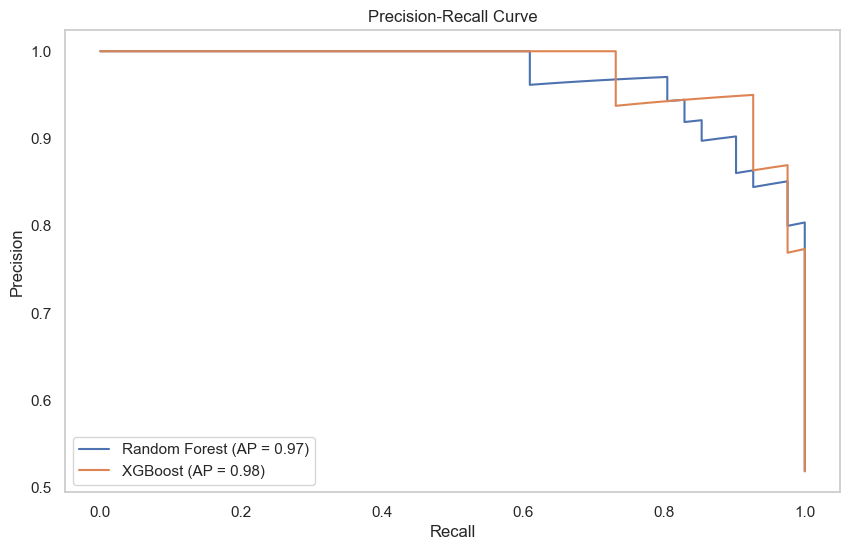

In [95]:
# Plot Precision-Recall curve
plt.figure(figsize=(10, 6))
plt.plot(rf_recall, rf_precision, label='Random Forest (AP = {:.2f})'.format(rf_avg_precision))
plt.plot(xgb_recall, xgb_precision, label='XGBoost (AP = {:.2f})'.format(xgb_avg_precision))

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()

#### Results
A sharp drop off can be seen as both models move to the left. This is also noticeable in the ROC curve. 

At 75% recall:
* The XGBoost model precision (orange line) drops precipitously to ~93%, as the Random Forest model precision (blue line) is at ~97%

At 80% recall:
* The models are tied

At 82% recall:
* The XGBoost model precision (orange line) tics up a bit to ~95%, whereas the Random Forest model precision (blue line) declines

The XGBoost model precision (orange line) continues to hold a slight edge until 97% recall 

## Use best model with test set
The above table shows, when refitted to Recall, the XGB Boost model performed slightly better than the Random Forest model on both the training and validation sets. It will be used with the test data.

In [96]:
# Use XGBoost model to predict on test data with best tree
XGB_test_preds = XGB_NLP_train.best_estimator_.predict(X_test_final)

In [97]:
help(get_test_scores)

Help on function get_test_scores in module model_scores:

get_test_scores(model_name: str, preds, y_test_data)
    get_test_scores calculates test scores for a model and returns them in a DataFrame.
    
    Parameters:
    model_name (str): name of model being evaluated
    preds: predictions made by model
    y_test_data: true labels for validation dataset
    
    Returns:
    pd.DataFrame: A DataFrame containing the model name and its corresponding validation scores.



In [98]:
# Pass scores to 'get_test_scores' function.
XGB_test = get_test_scores('XGBoost TEST', XGB_test_preds, y_test)
XGB_test

,Model,Precision,Recall,Accuracy,F1
0,XGBoost TEST,0.86,0.934783,0.904762,0.895833


#### Add to master results table

In [99]:
# Concatenate XGB_test model results table with master results table
final_table = pd.concat([results_table4, XGB_test])
final_table

,Model,Precision,Recall,Accuracy,F1
3,XGBoost val,0.926829,0.926829,0.924051,0.926829
0,Random Forest val,0.902439,0.902439,0.898734,0.902439
1,XGBoost train,0.824551,0.805000,0.809309,0.814573
2,Random Forest train,0.839649,0.798000,0.813652,0.815247
0,XGBoost TEST,0.860000,0.934783,0.904762,0.895833


In [100]:
# Save final results table
final_table.to_csv('Ancient_Results.csv', index=False)

In [101]:
# View results
final_table = pd.read_csv('Ancient_Results.csv')
final_table = final_table.sort_values(by=['Recall'], ascending=False)
final_table.head().round(4)

,Model,Precision,Recall,Accuracy,F1
4,XGBoost TEST,0.8600,0.9348,0.9048,0.8958
0,XGBoost val,0.9268,0.9268,0.9241,0.9268
1,Random Forest val,0.9024,0.9024,0.8987,0.9024
2,XGBoost train,0.8246,0.8050,0.8093,0.8146
3,Random Forest train,0.8396,0.7980,0.8137,0.8152


In [102]:
# Create a classification report
target_labels = ['Not hymn', 'Hymn']
print(classification_report(y_test, XGB_test_preds, target_names = target_labels))

              precision    recall  f1-score   support

    Not hymn       0.95      0.88      0.91        59
        Hymn       0.86      0.93      0.90        46

    accuracy                           0.90       105
   macro avg       0.90      0.91      0.90       105
weighted avg       0.91      0.90      0.91       105



### Create Evaluation Visuals

#### Confusion Matrix 

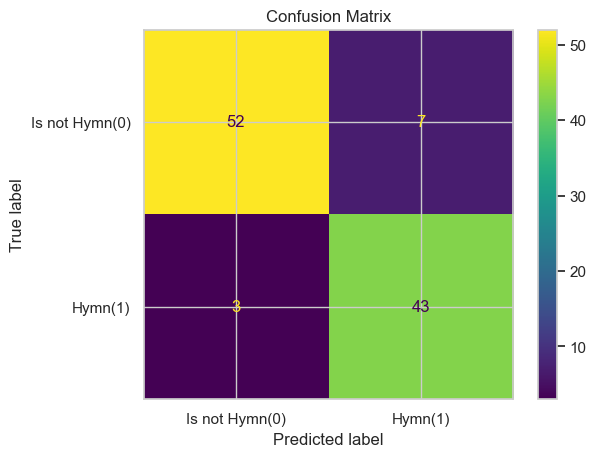

In [103]:
# Create confusion matrix to visualize how accurate classifier is at predicting labels for a categorical variable
cm = confusion_matrix(y_test, XGB_test_preds, labels=XGB_NLP_train.classes_)

# Visualize confusion matrix
XGB_disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels=['Is not Hymn(0)', 'Hymn(1)'])
XGB_disp.plot()
plt.title('Confusion Matrix');

## Final Test Results

The XGBoost model performed impressively well on the test data

> True Negatives(UL): # of 'Is not Hymn(0)' that the model accurately classified as 'Is not Hymn(0)' = 52\
> True Positives(LR): # of 'Hymn(1)' that the model accurately classified 'Hymn(1)' = 43

> False Positives(UR)/Type I Errors: # of 'Is not Hymn(0)' that the model classified were 'Hymn(1)' = 7\
> False Negatives(LL)/Type II Errors: # of 'Hymn(1)' that the model classified were 'Is not Hymn(0)' = 3

In choosing 'recall' as the metric, the model classified only 3 non-hymns as hymns, in its attempt to find all hymns. This made for an even more robust model with a 93% recall score.

The model also achieved an impressive 95% precision when classifying non-hymns as 'Is not Hymn(0)' <br>
It was less robust precisely identifying hymns with a precision of 86% <br>
The harmonic mean was 90%
